In [1]:
import stlearn as st
st.settings.set_figure_params(dpi=120)
# Reading data
data = st.Read10X(path="/home/d.pham/10X/BCBA/")
# Save raw_count
data.layers["raw_count"] = data.X
# Preprocessing
st.pp.filter_genes(data,min_cells=3)
st.pp.normalize_total(data)
st.pp.log1p(data)
# Keep raw data
data.raw = data
st.pp.scale(data)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


In [2]:
# Run PCA
st.em.run_pca(data,n_comps=50,random_state=0)
# Tiling image
st.pp.tiling(data,out_path="tiling",crop_size = 40)
# Using Deep Learning to extract feature
st.pp.extract_feature(data)
# Apply stSME spatial-PCA option
st.spatial.morphology.adjust(data,use_data="X_pca",radius=50,method="mean")
st.pp.neighbors(data,n_neighbors=25,use_rep='X_pca_morphology',random_state=0)
st.tl.clustering.louvain(data,random_state=0)

Tiling image:   3%|▎          [ time left: 00:03 ]

PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]
Adjusting data:   1%|           [ time left: 00:17 ]

The morphology feature is added to adata.obsm['X_morphology']!


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
Applying Louvain clustering ...
Louvain clustering is done! The labels are stored in adata.obs['louvain']


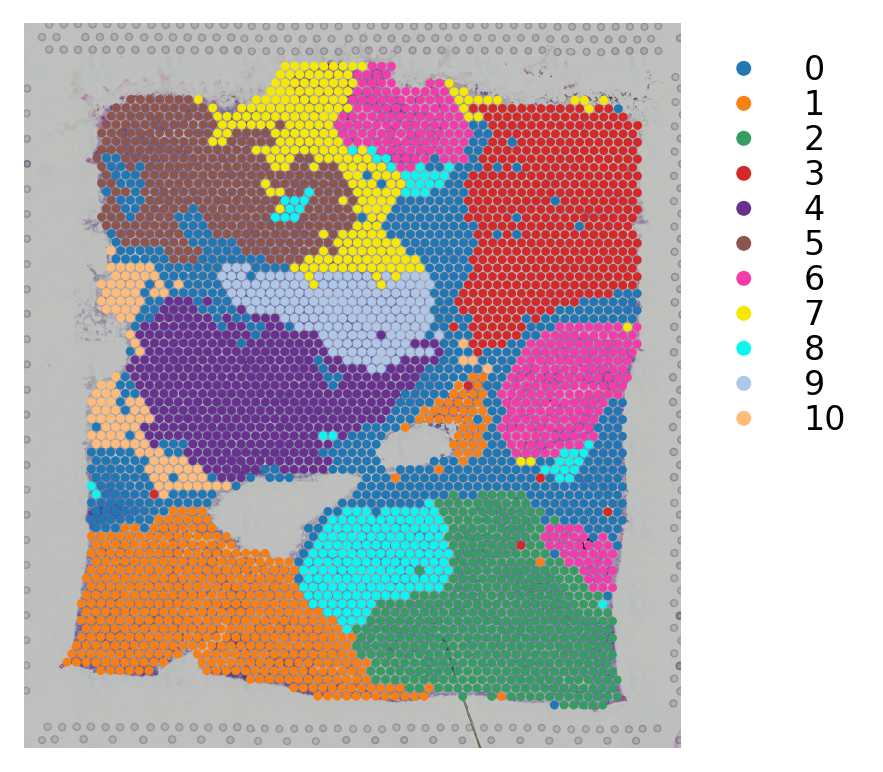

In [3]:
st.pl.cluster_plot(data,use_label="louvain",image_alpha=1,size=7)


In [4]:
data.uns["iroot"] = st.spatial.trajectory.set_root(data,use_label="louvain",cluster=6,use_raw=True)
st.spatial.trajectory.pseudotime(data,eps=50,use_rep="X_pca",use_label="louvain")

... storing 'feature_types' as categorical
... storing 'genome' as categorical


Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
All available trajectory paths are stored in adata.uns['available_paths'] with length < 4 nodes


/home/d.pham/anaconda3/envs/stlearn/lib/python3.8/site-packages/stlearn-0.4.0-py3.8.egg/stlearn/spatials/trajectory/pseudotime.py:196: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  v = np.array(list(dic.values()))
/home/d.pham/anaconda3/envs/stlearn/lib/python3.8/site-packages/stlearn-0.4.0-py3.8.egg/stlearn/spatials/trajectory/pseudotime.py:196: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  v = np.array(list(dic.values()))


In [5]:
st.spatial.trajectory.pseudotimespace_global(data,use_label="louvain",list_clusters=["6","8"])

Screening:   2%|▏          [ time left: 00:08 ]

Screening PTS global graph...


Screening: 100%|██████████ [ time left: 00:00 ]
Calculating:  49%|████▉      [ time left: 00:00 ]

Calculate the graph dissimilarity using Laplacian matrix...


Calculating: 100%|██████████ [ time left: 00:00 ]


The optimized weighting is: 0.76
Start to construct the trajectory: 6 -> 8


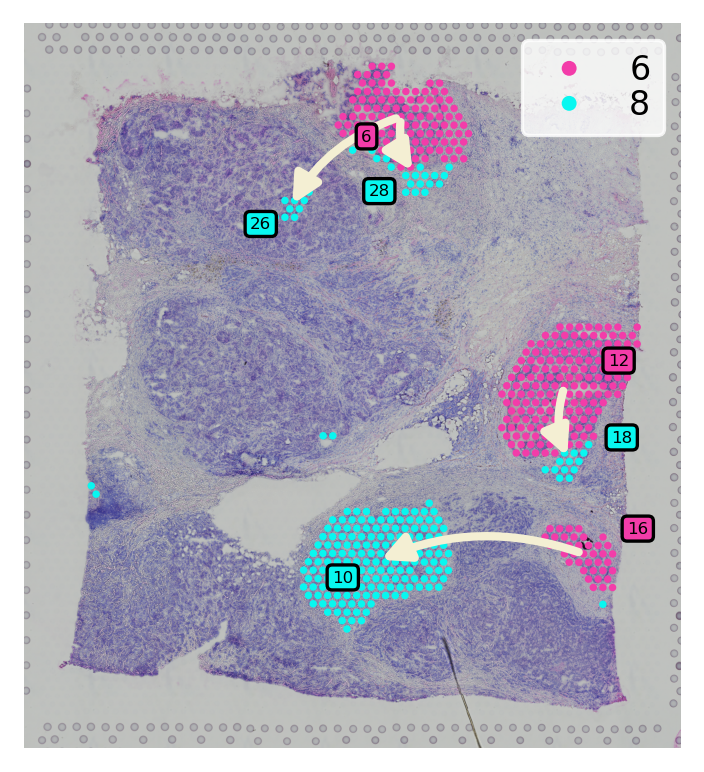

In [6]:
st.pl.cluster_plot(data,use_label="louvain",show_trajectories=True,list_clusters=["6","8"],show_subcluster=True)

PAGA plot:


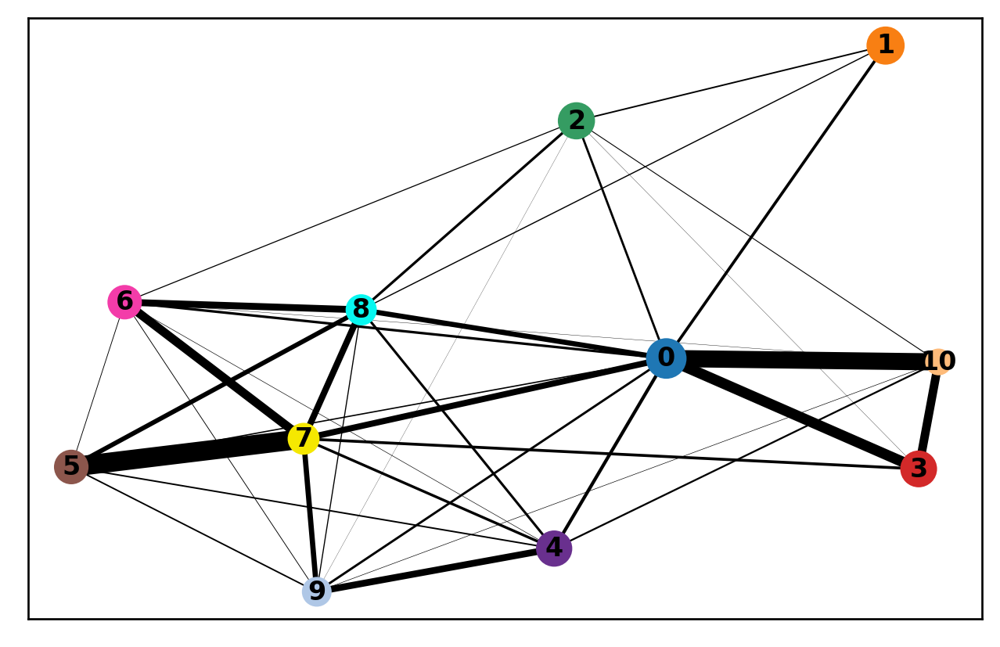

Gene expression (reduced dimension) plot:


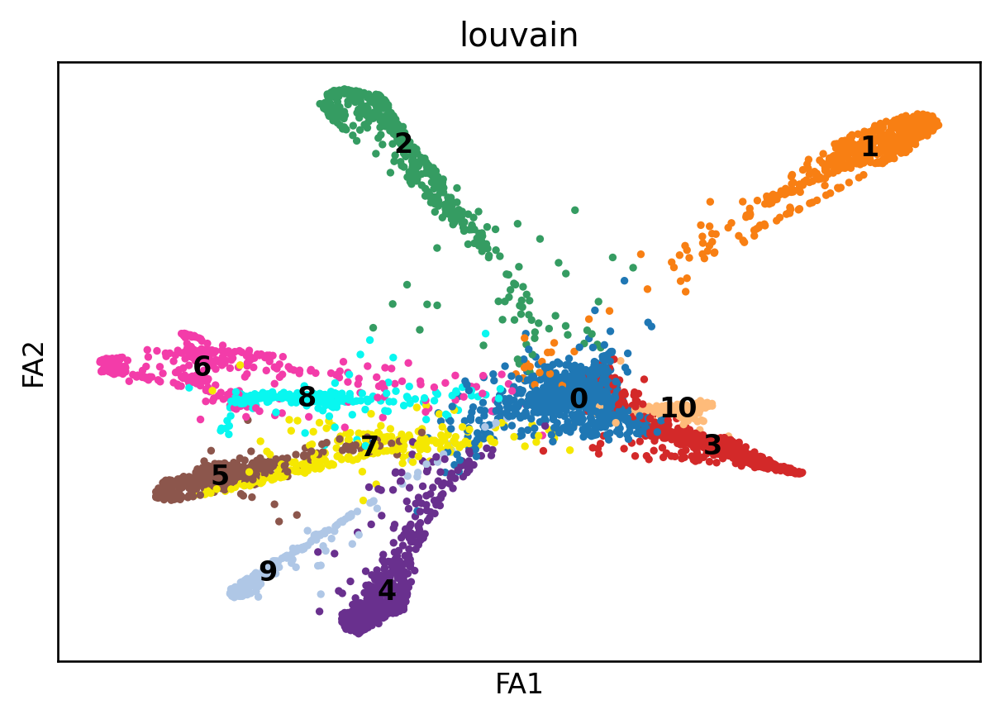

Diffusion pseudotime plot:


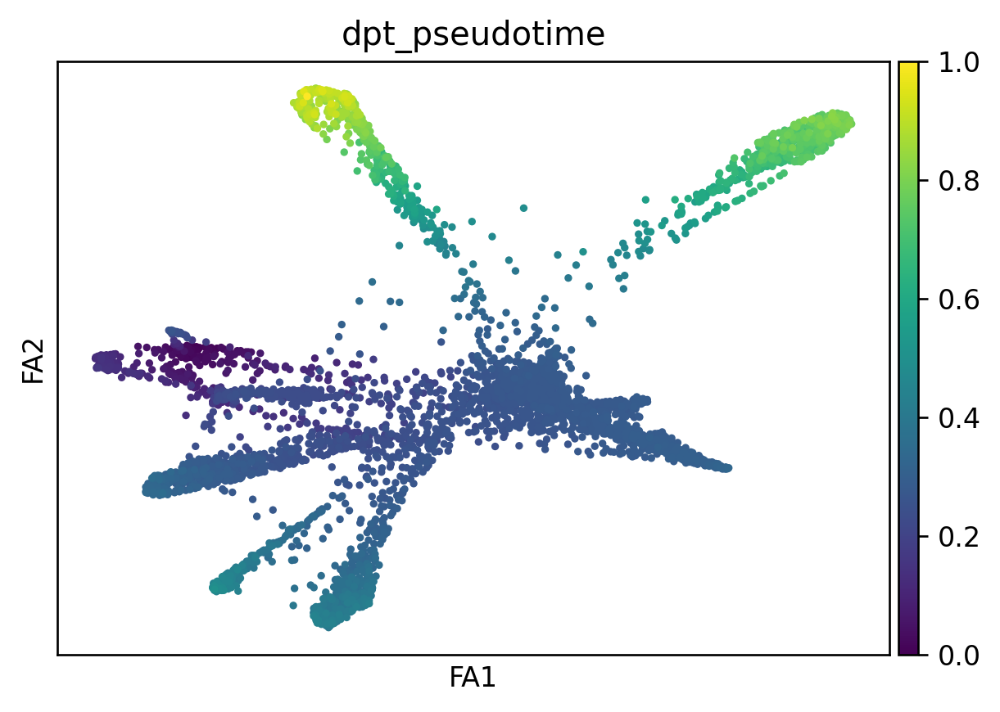

In [7]:
st.pl.non_spatial_plot(data)

In [8]:
import scanpy as sc
sc.tl.umap(data)

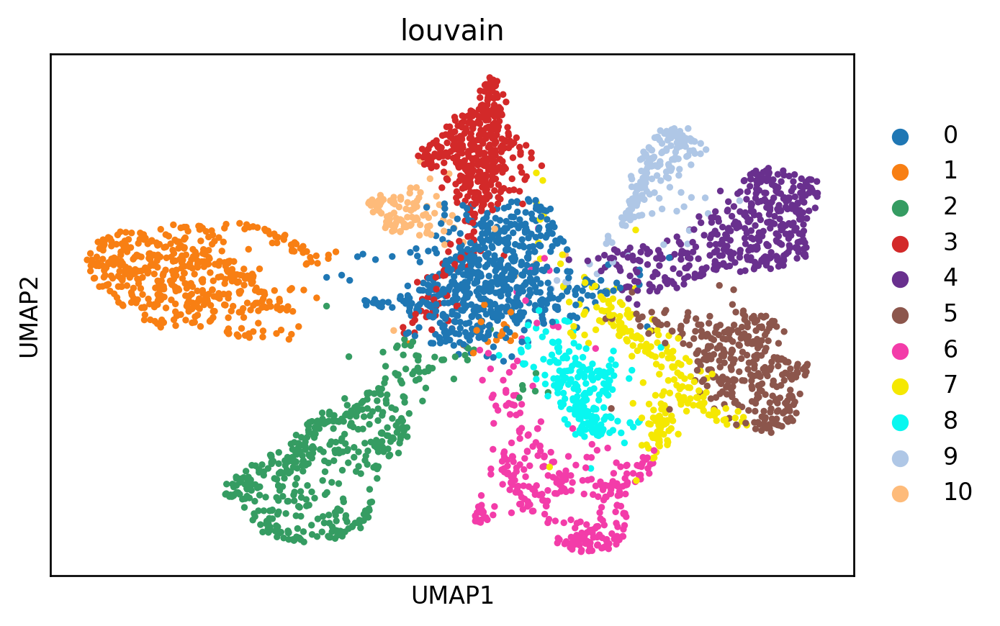

In [9]:
sc.pl.umap(data,color="louvain")

/home/d.pham/anaconda3/envs/stlearn/lib/python3.8/site-packages/stlearn-0.4.0-py3.8.egg/stlearn/plotting/trajectory/pseudotime_plot.py:265: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cb = plt.colorbar(plot, cmap="viridis")


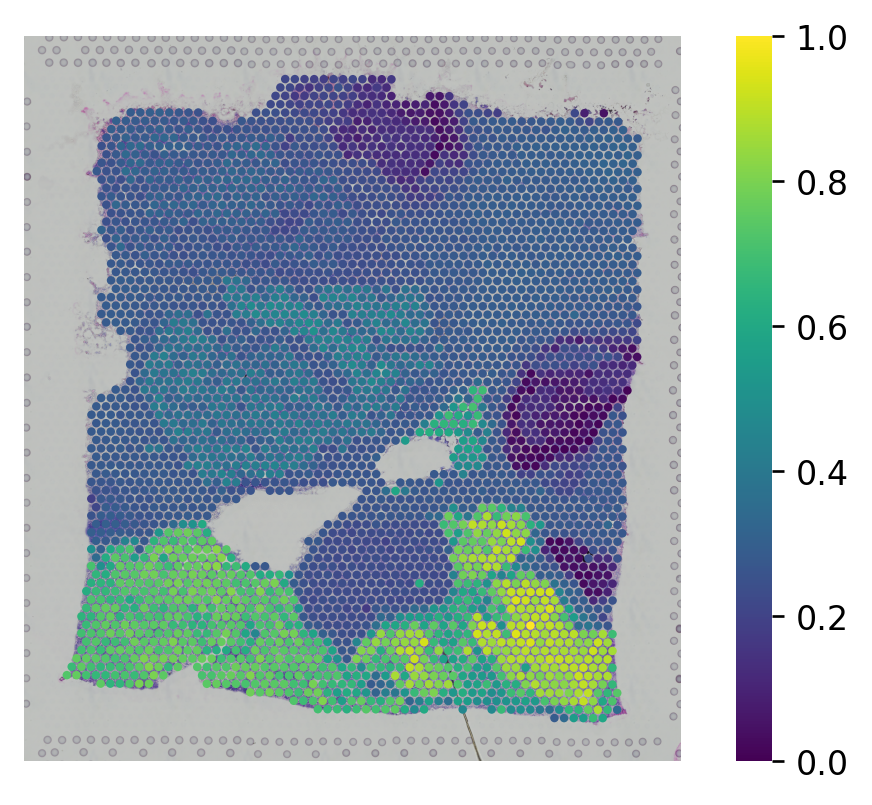

In [10]:
st.pl.trajectory.pseudotime_plot(data,pseudotime_key="dpt_pseudotime",use_label="louvain",show_graph=False)

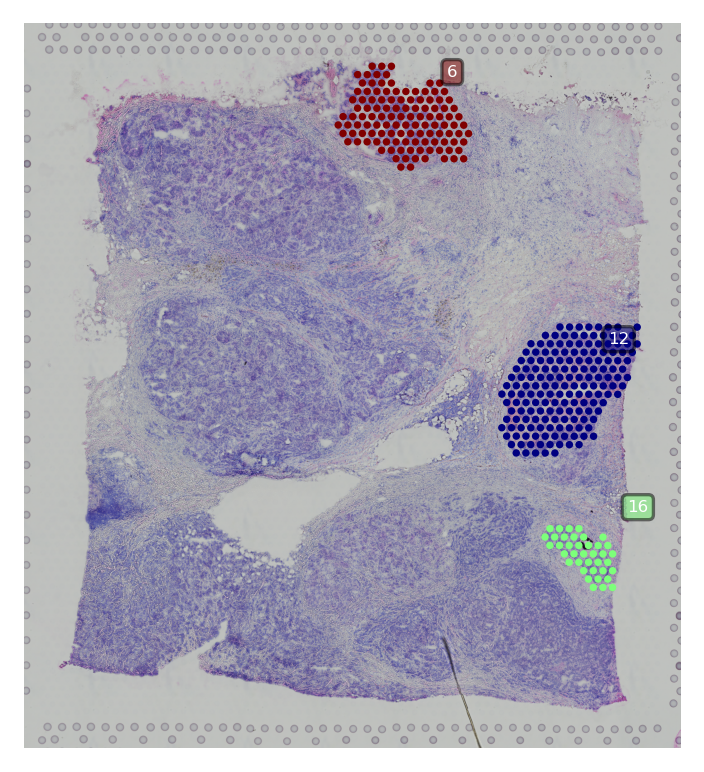

In [11]:
st.pl.subcluster_plot(data,use_label="louvain", cluster="6")

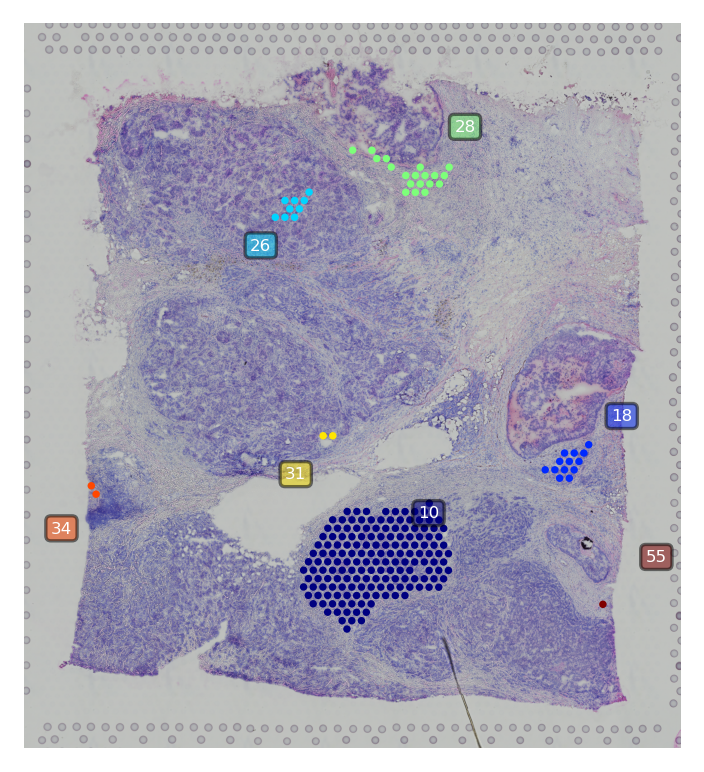

In [12]:
st.pl.subcluster_plot(data,use_label="louvain", cluster="8")

/home/d.pham/anaconda3/envs/stlearn/lib/python3.8/site-packages/stlearn-0.4.0-py3.8.egg/stlearn/plotting/trajectory/pseudotime_plot.py:265: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cb = plt.colorbar(plot, cmap="viridis")


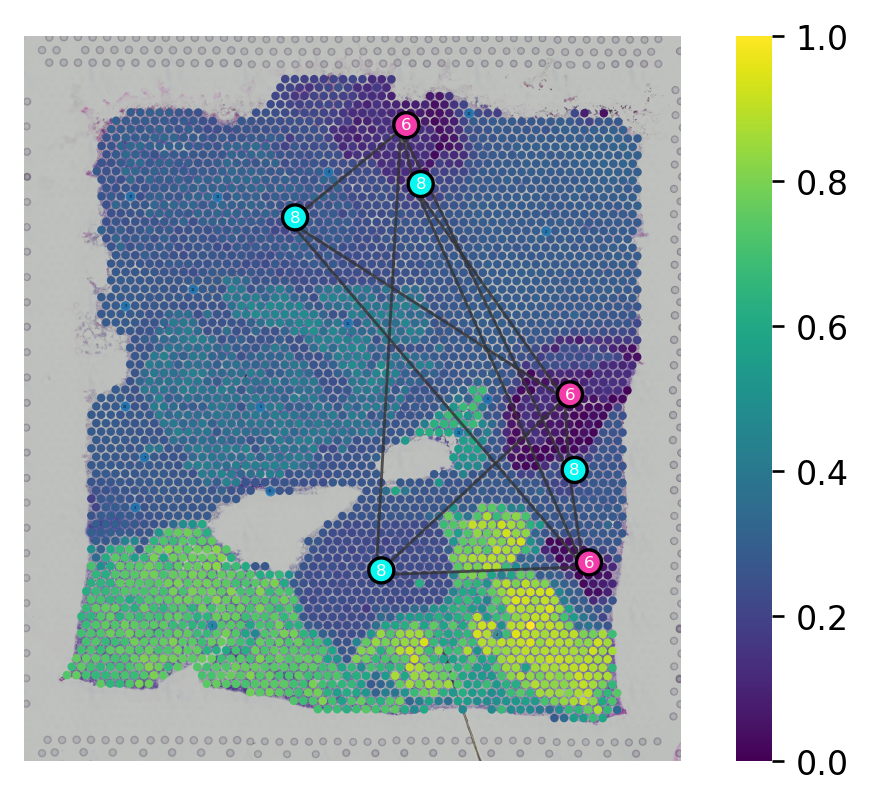

In [13]:
st.pl.trajectory.pseudotime_plot(data,pseudotime_key="dpt_pseudotime",use_label="louvain",show_graph=True,list_clusters=["6","8"])

The annotation is added to adata.obs['louvain_anno']


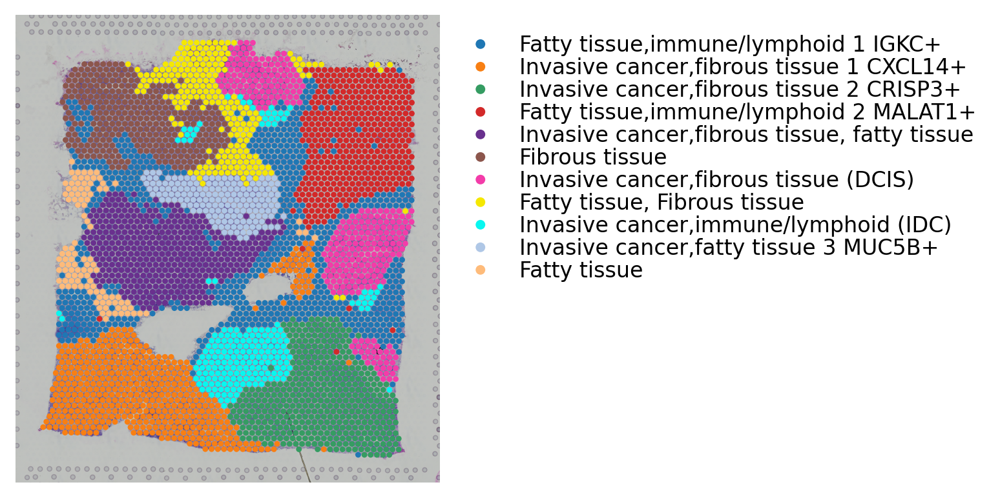

In [14]:
st.add.annotation(data,label_list=['Fatty tissue,immune/lymphoid 1 IGKC+',
                                   'Invasive cancer,fibrous tissue 1 CXCL14+',
                                   'Invasive cancer,fibrous tissue 2 CRISP3+',
                                   'Fatty tissue,immune/lymphoid 2 MALAT1+',
                                   'Invasive cancer,fibrous tissue, fatty tissue',
                                   'Fibrous tissue',
                                   'Invasive cancer,fibrous tissue (DCIS)',
                                   'Fatty tissue, Fibrous tissue',
                                   'Invasive cancer,immune/lymphoid (IDC)' ,
                                   'Invasive cancer,fatty tissue 3 MUC5B+',
                                   'Fatty tissue'],
                 use_label="louvain")
st.pl.cluster_plot(data,use_label="louvain_anno",image_alpha=1,size=7)

In [15]:
non_mito_genes_list = [name for name in data.var_names if not name.startswith('MT-')]
non_rpl_genes_list = [name for name in data.var_names if not name.startswith('RPL')]
non_rps_genes_list = [name for name in data.var_names if not name.startswith('RPS')]
non_atp_genes_list = [name for name in data.var_names if not name.startswith('ATP')]

good_genes = list(set(non_mito_genes_list) & set(non_rpl_genes_list) & set(non_rps_genes_list) & set(non_atp_genes_list))

In [16]:
data = data[:, good_genes]

In [17]:
sc.tl.rank_genes_groups(data, 'louvain_anno', method='wilcoxon',use_raw=False)

Trying to set attribute `.uns` of view, copying.


categories: Fatty tissue,immune/lymphoid 1 IGKC+, Invasive cancer,fibrous tissue 1 CXCL14+, Invasive cancer,fibrous tissue 2 CRISP3+, etc.
var_group_labels: Fatty tissue,immune/lymphoid 1 IGKC+, Fatty tissue,immune/lymphoid 2 MALAT1+, Fatty tissue, Fibrous tissue, etc.


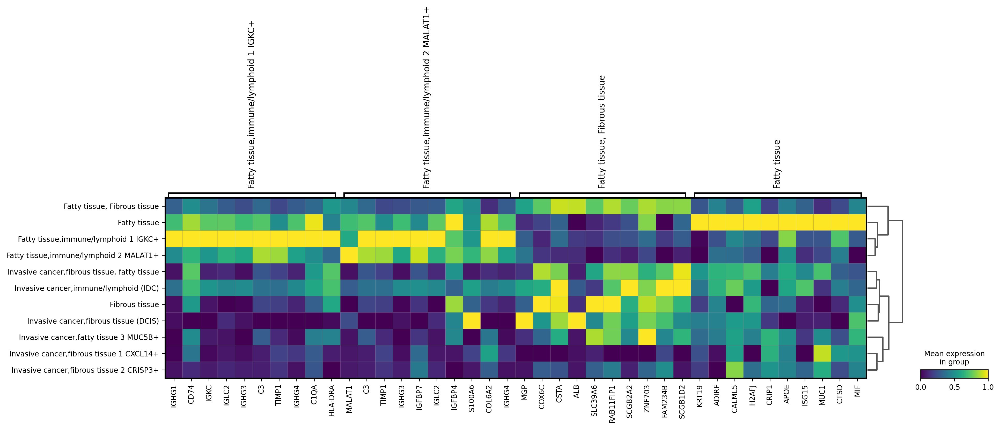

In [18]:
sc.pl.rank_genes_groups_matrixplot(data, standard_scale='var',groups=["Fatty tissue,immune/lymphoid 1 IGKC+",
                                                                      "Fatty tissue,immune/lymphoid 2 MALAT1+",
                                                                      "Fatty tissue, Fibrous tissue",
                                                                      "Fatty tissue"])

categories: Fatty tissue,immune/lymphoid 1 IGKC+, Invasive cancer,fibrous tissue 1 CXCL14+, Invasive cancer,fibrous tissue 2 CRISP3+, etc.
var_group_labels: Invasive cancer,fibrous tissue 1 CXCL14+, Invasive cancer,fibrous tissue 2 CRISP3+, Invasive cancer,fibrous tissue, fatty tissue, etc.


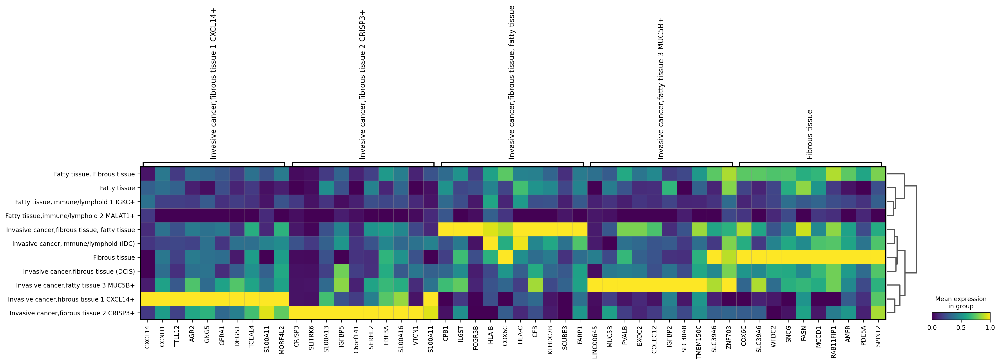

In [19]:
sc.pl.rank_genes_groups_matrixplot(data, standard_scale='var',groups=["Invasive cancer,fibrous tissue 1 CXCL14+",
                                                                      "Invasive cancer,fibrous tissue 2 CRISP3+",
                                                                      "Invasive cancer,fibrous tissue, fatty tissue",
                                                                      "Invasive cancer,fatty tissue 3 MUC5B+",
                                                                     "Fibrous tissue"])

categories: Fatty tissue,immune/lymphoid 1 IGKC+, Invasive cancer,fibrous tissue 1 CXCL14+, Invasive cancer,fibrous tissue 2 CRISP3+, etc.
var_group_labels: Invasive cancer,fibrous tissue (DCIS)


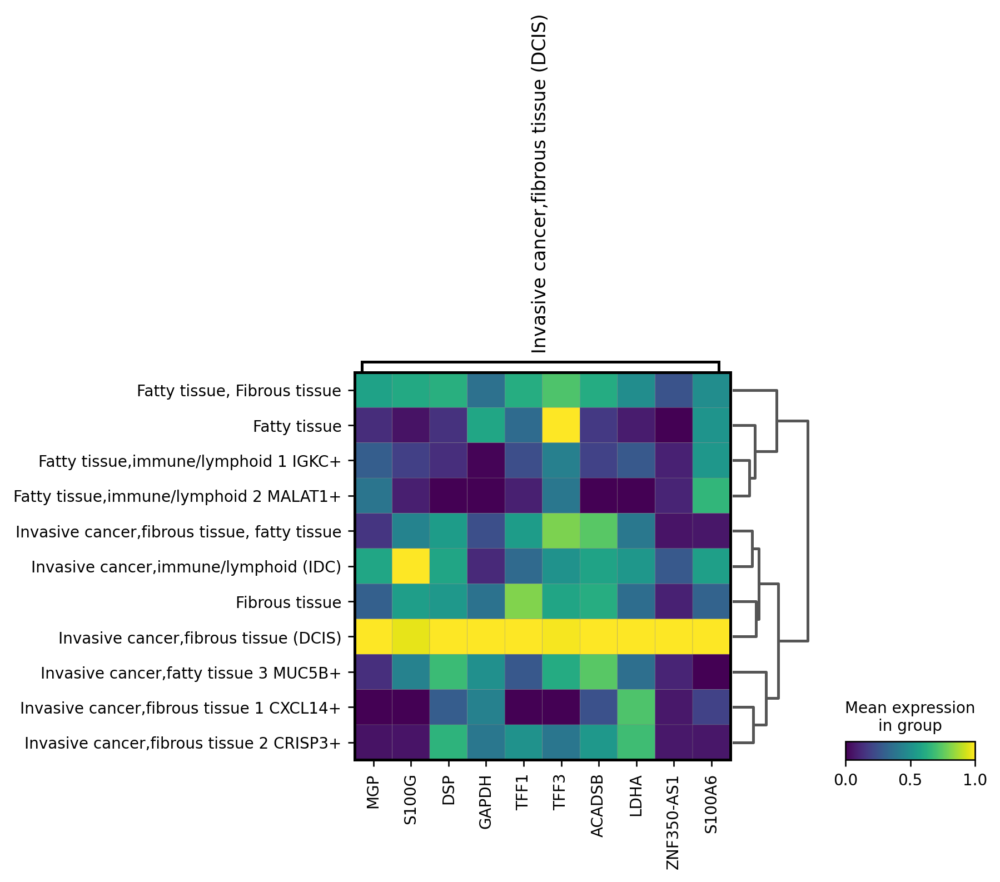

In [20]:
sc.pl.rank_genes_groups_matrixplot(data, standard_scale='var',groups=["Invasive cancer,fibrous tissue (DCIS)"])

categories: Fatty tissue,immune/lymphoid 1 IGKC+, Invasive cancer,fibrous tissue 1 CXCL14+, Invasive cancer,fibrous tissue 2 CRISP3+, etc.
var_group_labels: Invasive cancer,immune/lymphoid (IDC)


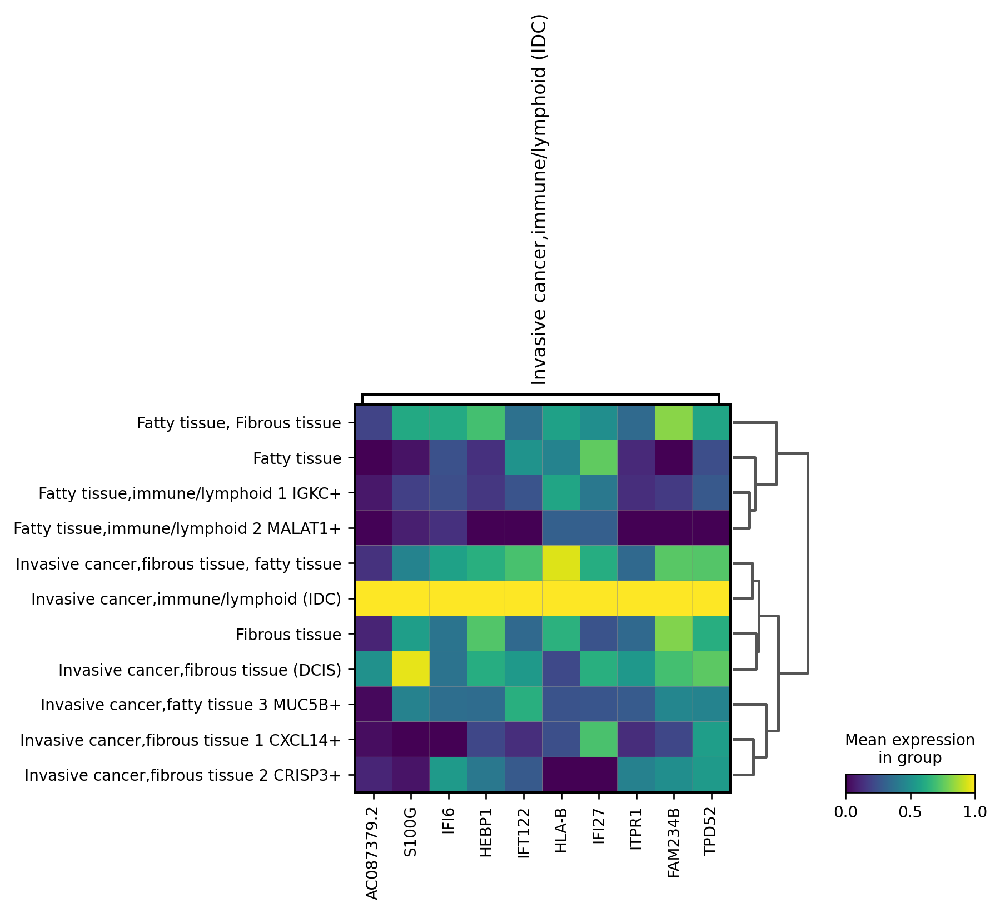

In [21]:
sc.pl.rank_genes_groups_matrixplot(data, standard_scale='var',groups=["Invasive cancer,immune/lymphoid (IDC)"])

/home/d.pham/anaconda3/envs/stlearn/lib/python3.8/site-packages/stlearn-0.4.0-py3.8.egg/stlearn/plotting/classes.py:191: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cb = plt.colorbar(


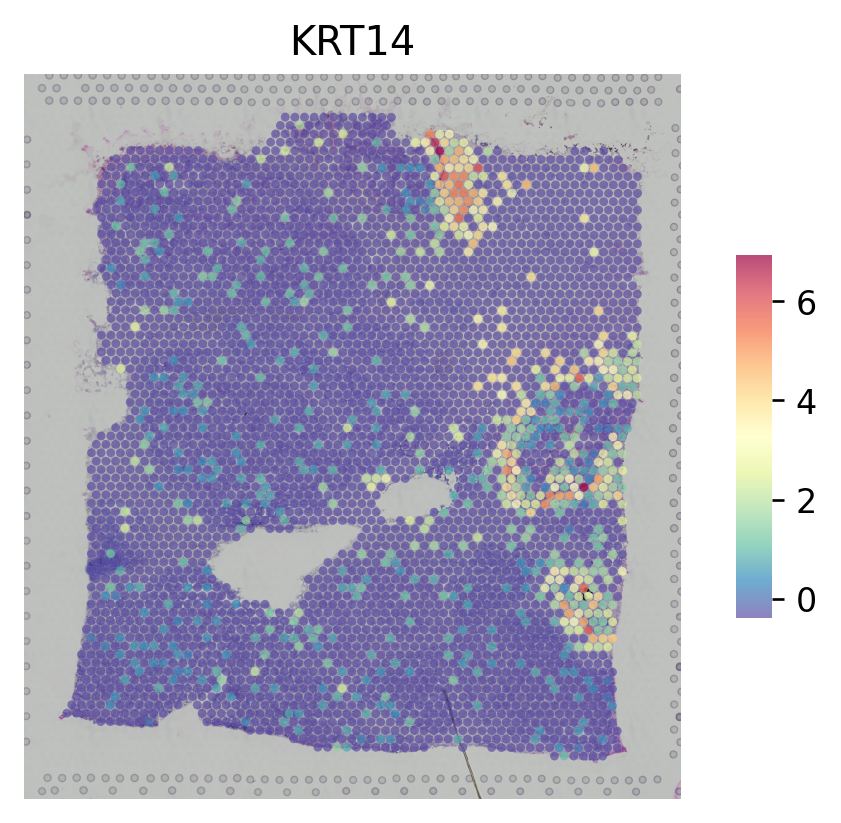

In [22]:
st.pl.gene_plot(data,gene_symbols="KRT14")

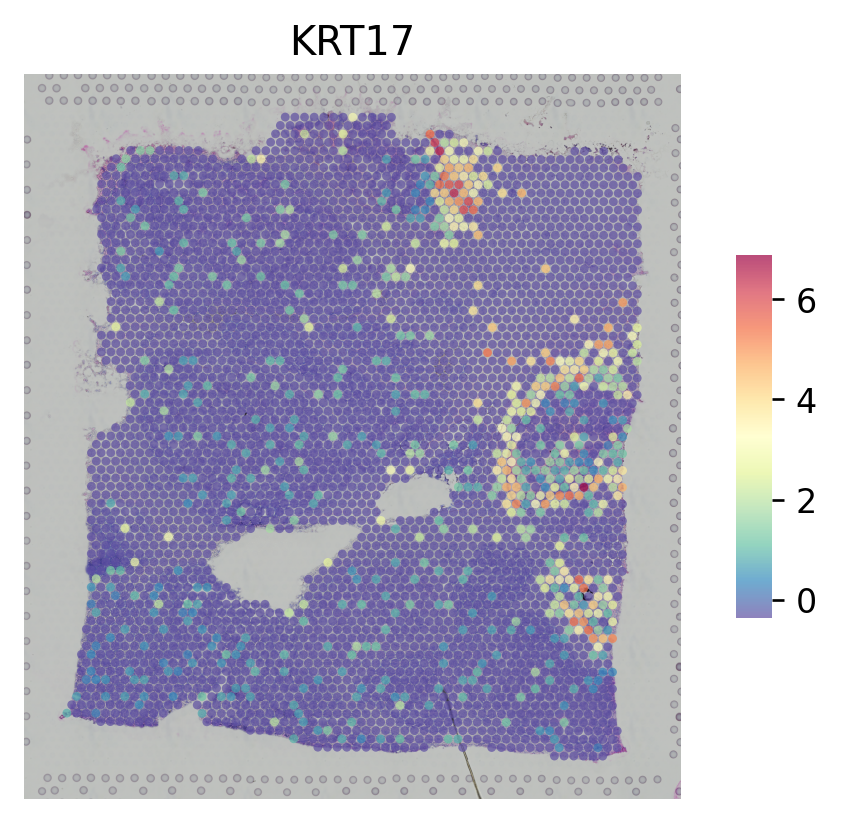

In [23]:
st.pl.gene_plot(data,gene_symbols="KRT17")